# Отток клиентов

Из «Бета-Банка» стали уходить клиенты. Каждый месяц. Немного, но заметно. Банковские маркетологи посчитали: сохранять текущих клиентов дешевле, чем привлекать новых.

Нужно спрогнозировать, уйдёт клиент из банка в ближайшее время или нет. Имеются исторические данные о поведении клиентов и расторжении договоров с банком. 

Необходимо посторить модель с предельно большим значением *F1*-меры. Целевое значение - не менее 0.59. Дополнительная метрика - *AUC-ROC*.

Источник данных: [https://www.kaggle.com/barelydedicated/bank-customer-churn-modeling](https://www.kaggle.com/barelydedicated/bank-customer-churn-modeling)

<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Загрузка-данных-и-библиотек" data-toc-modified-id="Загрузка-данных-и-библиотек-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Загрузка данных и библиотек</a></span></li><li><span><a href="#Подготовка-и-анализ-данных" data-toc-modified-id="Подготовка-и-анализ-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Подготовка и анализ данных</a></span></li><li><span><a href="#Тестирование-моделей" data-toc-modified-id="Тестирование-моделей-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Тестирование моделей</a></span><ul class="toc-item"><li><span><a href="#Определение-качесва-моделей" data-toc-modified-id="Определение-качесва-моделей-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Определение качесва моделей</a></span></li><li><span><a href="#Baseline" data-toc-modified-id="Baseline-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Baseline</a></span></li><li><span><a href="#Логистическая-регрессия" data-toc-modified-id="Логистическая-регрессия-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Логистическая регрессия</a></span></li><li><span><a href="#Метод-k-ближайших-соседей" data-toc-modified-id="Метод-k-ближайших-соседей-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Метод k-ближайших соседей</a></span></li><li><span><a href="#Метод-опорных-векторов" data-toc-modified-id="Метод-опорных-векторов-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>Метод опорных векторов</a></span></li><li><span><a href="#Метод-случайного-леса" data-toc-modified-id="Метод-случайного-леса-3.6"><span class="toc-item-num">3.6&nbsp;&nbsp;</span>Метод случайного леса</a></span></li><li><span><a href="#Градиентный-бустинг" data-toc-modified-id="Градиентный-бустинг-3.7"><span class="toc-item-num">3.7&nbsp;&nbsp;</span>Градиентный бустинг</a></span></li><li><span><a href="#Интерпретация-(дополнение)" data-toc-modified-id="Интерпретация-(дополнение)-3.8"><span class="toc-item-num">3.8&nbsp;&nbsp;</span>Интерпретация (дополнение)</a></span></li></ul></li><li><span><a href="#Итоги-тестирования" data-toc-modified-id="Итоги-тестирования-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Итоги тестирования</a></span></li></ul></div>

## Загрузка данных и библиотек

In [1]:
# Увеличение разрешения визуализаций
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

/tmp/ipykernel_155/4102136135.py:3: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('retina')


In [2]:
# Сразу подготовим инструменты для дальнейшего использования
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

In [3]:
! pip install phik
! pip install shap
! pip install imblearn
! pip install plot_metric

In [4]:
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.metrics import roc_auc_score, f1_score
from sklearn.preprocessing import StandardScaler
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

from catboost import Pool
from catboost import CatBoostClassifier

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks
from imblearn.pipeline import Pipeline, make_pipeline

from plot_metric.functions import BinaryClassification

import phik
import shap
shap.initjs()

In [5]:
# Загрузим датафрейм и взглянем на него
df = pd.read_csv('/datasets/Churn.csv')
data = df.copy()
df

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2.0,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1.0,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8.0,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1.0,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2.0,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,15606229,Obijiaku,771,France,Male,39,5.0,0.00,2,1,0,96270.64,0
9996,9997,15569892,Johnstone,516,France,Male,35,10.0,57369.61,1,1,1,101699.77,0
9997,9998,15584532,Liu,709,France,Female,36,7.0,0.00,1,0,1,42085.58,1
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3.0,75075.31,2,1,0,92888.52,1


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           9091 non-null   float64
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(3), int64(8), object(3)
memory usage: 1.1+ MB


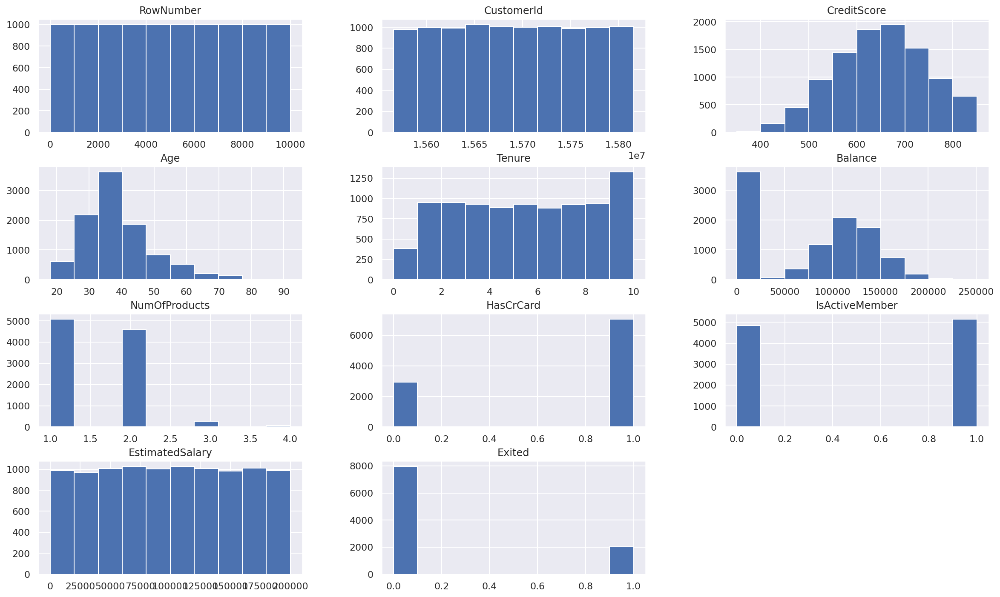

In [6]:
# Общая информация о данных
df.hist(figsize=(20, 12))
df.info()

Описание данных:

Признаки
- `RowNumber` — индекс строки в данных
- `CustomerId` — уникальный идентификатор клиента
- `Surname` — фамилия
- `CreditScore` — кредитный рейтинг
- `Geography` — страна проживания
- `Gender` — пол
- `Age` — возраст
- `Tenure` — сколько лет человек является клиентом банка
- `Balance` — баланс на счёте
- `NumOfProducts` — количество продуктов банка, используемых клиентом
- `HasCrCard` — наличие кредитной карты
- `IsActiveMember` — активность клиента
- `EstimatedSalary` — предполагаемая зарплата

Целевой признак
- `Exited` — факт ухода клиента

## Подготовка и анализ данных

In [7]:
# Посмторим на количество пропусков
df.isna().sum()

RowNumber            0
CustomerId           0
Surname              0
CreditScore          0
Geography            0
Gender               0
Age                  0
Tenure             909
Balance              0
NumOfProducts        0
HasCrCard            0
IsActiveMember       0
EstimatedSalary      0
Exited               0
dtype: int64

In [8]:
# Проверим, нельзя ли заполнить пропуски
df.Tenure.value_counts(dropna=False)

1.0     952
2.0     950
8.0     933
3.0     928
5.0     927
7.0     925
NaN     909
4.0     885
9.0     882
6.0     881
10.0    446
0.0     382
Name: Tenure, dtype: int64

Значения невозможно заполнить адекватными значениями, поэтому позже удалим объекты с пропусками.

In [9]:
# Посмотрим на типы данных
df.dtypes

RowNumber            int64
CustomerId           int64
Surname             object
CreditScore          int64
Geography           object
Gender              object
Age                  int64
Tenure             float64
Balance            float64
NumOfProducts        int64
HasCrCard            int64
IsActiveMember       int64
EstimatedSalary    float64
Exited               int64
dtype: object

Типы данных в норме, надо проверить количесвто уникальных значений `Geography`

In [10]:
# Посмотрим на количесво стран в выборке
df.Geography.value_counts()

France     5014
Germany    2509
Spain      2477
Name: Geography, dtype: int64

Также мы видим дисбаланс классов.

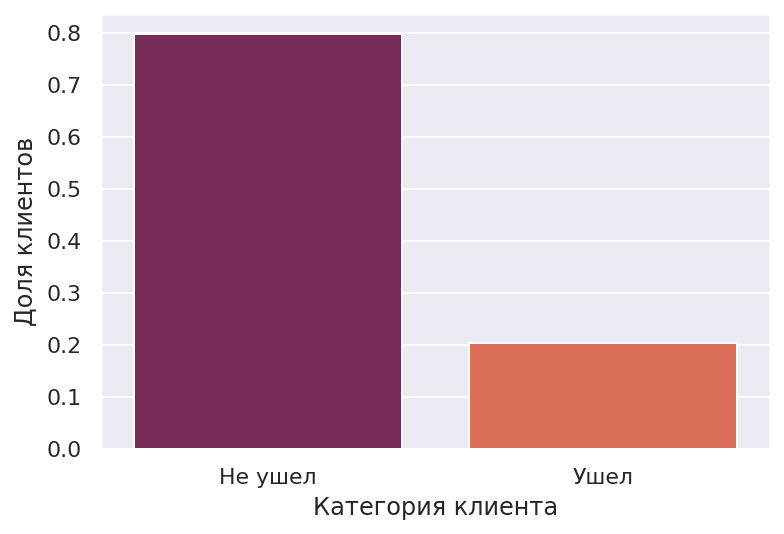

In [11]:
sns.barplot(x=['Не ушел', 'Ушел'], y=df.Exited.value_counts(normalize=True), palette="rocket")
plt.xlabel('Категория клиента')
plt.ylabel('Доля клиентов')
plt.show()

Посмтрим на визуальную взаимосвязь фичей, проверив, нет ли ярко выраженной мультиколлинеарности.

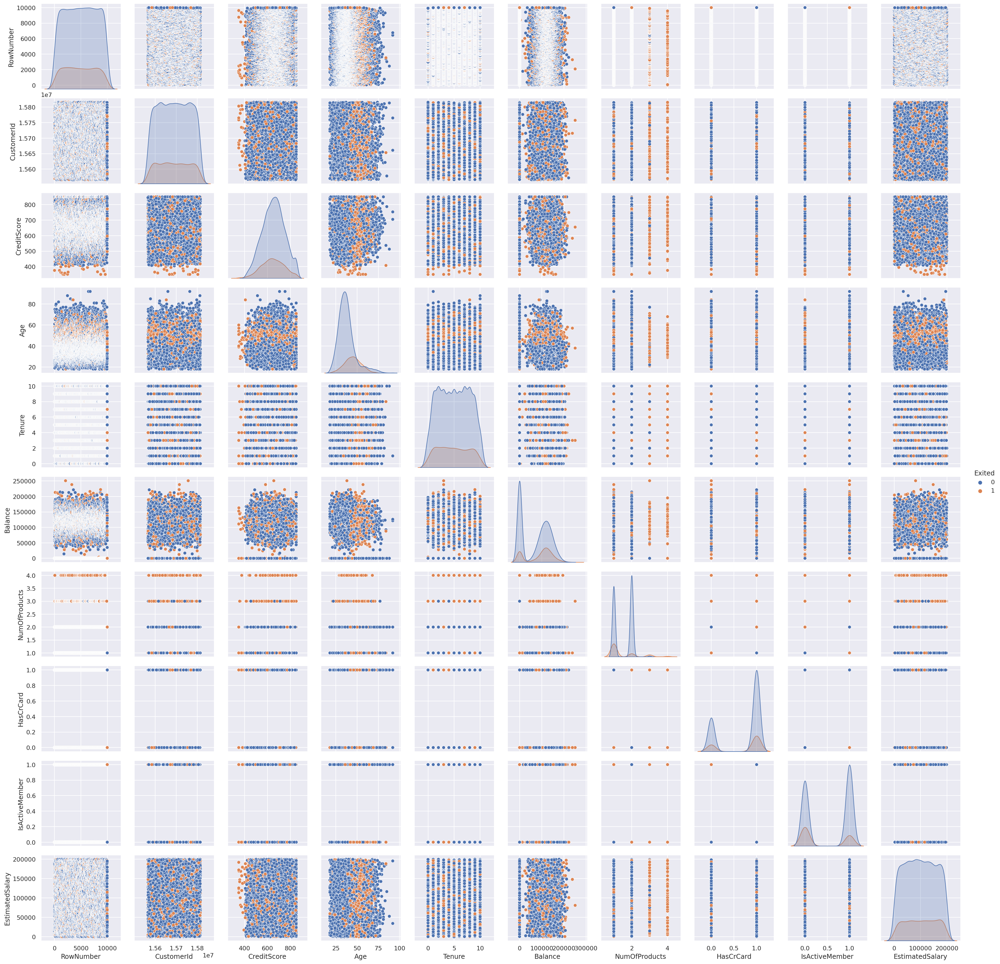

In [12]:
sns.pairplot(df, hue='Exited')

Наглядных зависимостей нет, но так как многие фичи бинарные или категориальные, проверим это с использовванием корреляции 𝜙k, которая хорошо работает и с категориальными фичами.

In [13]:
phik_overview = df.phik_matrix()

interval columns not set, guessing: ['RowNumber', 'CustomerId', 'CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary', 'Exited']


<AxesSubplot:>

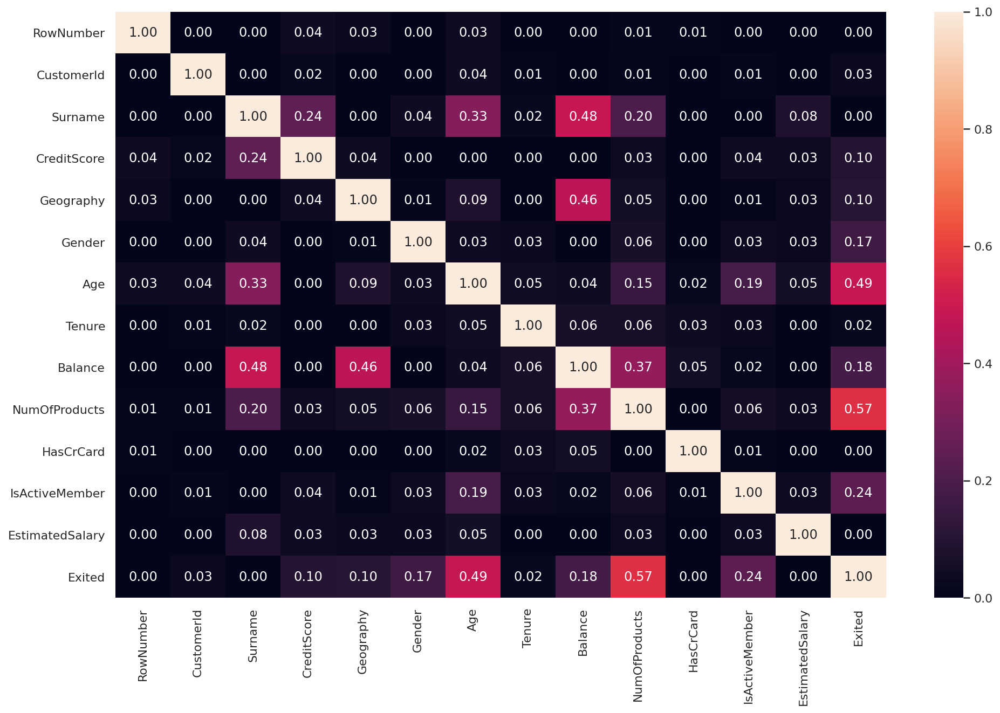

In [14]:
plt.figure(figsize=(16, 10))
sns.heatmap(phik_overview, annot=True, fmt=".2f")

Корреляция `Surname` и `Balance`, скорее всего случайна. Небольшие опасения вызывает `Geography` и `Balance`, но учитывая что коэфициент корреляции меньше 0.5 - можно оставить обе фичи.

С целевым признаком наибольшую корреляцию имеют признаки `NumOfProducts`, `Age` и `IsActiveMember` соответственно. Дальше будем рассматривать линейные модели с учетом только этих 3 признаков и с учетом остальных. Также таким образом мы можем потенциально избежать проблем с корреляцией `Geography` и `Balance`.

Фичи `RowNumber`, `CustomerId` и `Surname` не представляют для нас интереса, поэтому удалим их.

In [15]:
df = df.drop(['RowNumber', 'CustomerId', 'Surname'], axis=1)

In [16]:
# Проверяем удаление
df.columns

Index(['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure', 'Balance',
       'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary',
       'Exited'],
      dtype='object')

Так как многие модели не могут работать с категориальными признаками, воспользуемся OHE.

In [17]:
df = pd.get_dummies(df, drop_first=True)

In [18]:
# Посмотрим на новые признаки
df.columns

Index(['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited', 'Geography_Germany',
       'Geography_Spain', 'Gender_Male'],
      dtype='object')

In [19]:
# Удалим объекты с пропусками
df = df.dropna(subset=['Tenure'])

Теперь разделяем выборку на тренировочную, валидационную и тестовую. Валидационная выборка нужна, так как мы будем сравнивать разные подходы к одним и тем же моделям, после чего лучшую модель каждого типа проверять на тестовой.

In [20]:
train_full, test = train_test_split(df, train_size=0.8, stratify=df.Exited, random_state=42)
train, val = train_test_split(train_full, train_size=0.75, stratify=train_full.Exited, random_state=42)

In [21]:
# Определяем признаки, которые будем использовать для прогнозирования целевого
X = ['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Geography_Germany',
       'Geography_Spain', 'Gender_Male']
# Определяем признаки с самой высокой корреляцией с целевым
X_corr = ['NumOfProducts', 'Age', 'IsActiveMember']
# Определяем целевой признак
y = 'Exited'

Воспользуемся несколькими приемами для обработки дисбаланса классов.

In [22]:
train.Exited.value_counts(normalize=True)

0    0.796113
1    0.203887
Name: Exited, dtype: float64

Соотношение классов:
<br>
класс 0 (не ушел) - 80%
<br>
класс 1 (ушел) - 20%

Различие сильное, но не критичное. Можно будет пробовать обучать модели как на сырых данных, так и на сэмплированных.
<br>
Попробуем алгоритм SMOTE для оверсэмплирования.

In [23]:
smote = SMOTE(random_state=42)
X_sm, y_sm = smote.fit_resample(train[X], train[y])

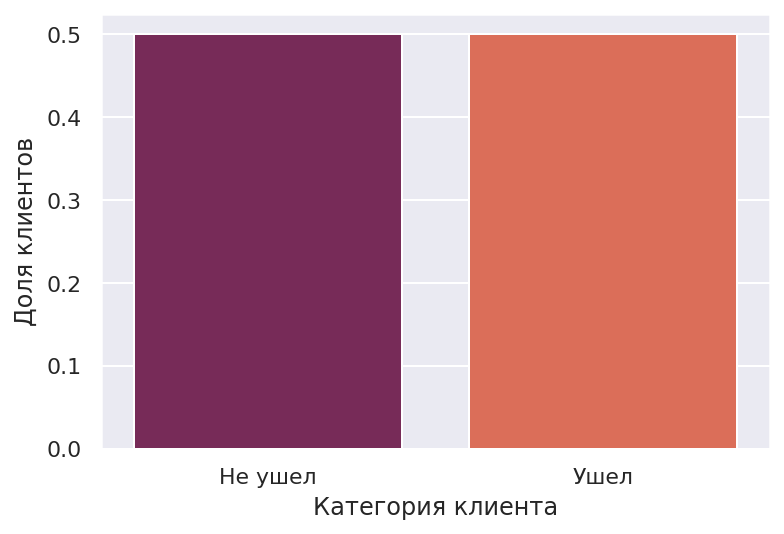

In [24]:
sns.barplot(x=['Не ушел', 'Ушел'], y=y_sm.value_counts(normalize=True), palette="rocket")
plt.xlabel('Категория клиента')
plt.ylabel('Доля клиентов')
plt.show()

Таким образом мы сгенерировали много объектов класса 1 (ушел), похожих всеми признаками на объекты соответствующего класса, но не полностью их дублируя.

Теперь воспользуемся алгоритмом Tomek Links для андерсэмплирования.

In [25]:
tl = TomekLinks()
X_tl, y_tl = tl.fit_resample(train[X], train[y])

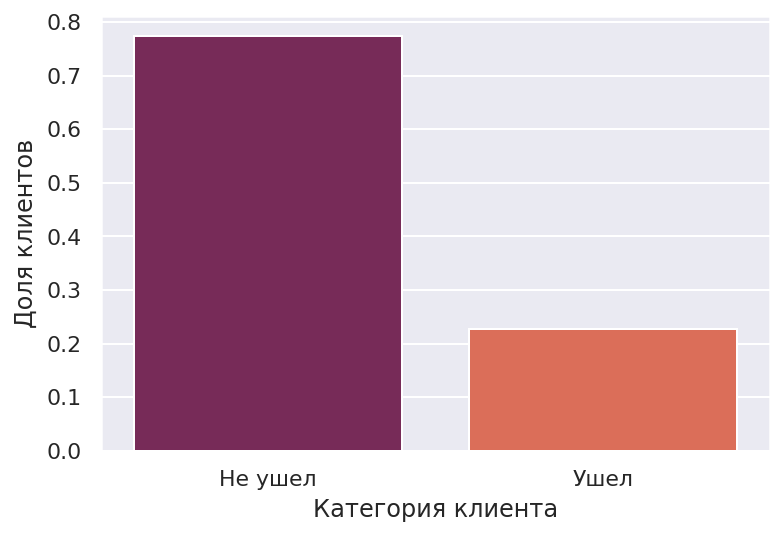

In [26]:
sns.barplot(x=['Не ушел', 'Ушел'], y=y_tl.value_counts(normalize=True), palette="rocket")
plt.xlabel('Категория клиента')
plt.ylabel('Доля клиентов')
plt.show()

В данном случае соотношение классов изменилось совсем не сильно, но так как дисбаланс классов не слишком силен, это не должно быть проблемой. Однако с помощью данного алгоритма мы удалили объекты класс 0 (не ушел), которые были похожи на объекты класса 1 (ушел) - это может помочь обучить более стабильные модели. 

## Тестирование моделей

### Определение качесва моделей
Сначала сразу определим функцию для определения качества модели. Мы будем вычислять площадь под ROC-кривой и перебирать порог бинаризации выходных значений классификатора для получения максимального значения метрики F1. Затем к скорам на тестовой выборке мы будем применять порог найденный на валидационной выборке.

In [27]:
def metrics(y_true, proba, threshold=0):
    proba = proba[:, 1]
    res_f1 = 0
    if threshold == 0:
        # Перебираем значения порога
        for i in np.linspace(0, 1, num=100):
            # Прогнозируем класс на основе выбранного порога
            pred = np.where(proba >= i, 1, 0)
            # Считаем f1 для каждого порога
            f1 = f1_score(y_true, pred)
            # Сохраняем лучший порог по значению f1
            if res_f1 < f1:
                res_f1 = f1
                threshold = i
    else:
        pred = np.where(proba >= threshold, 1, 0)
        res_f1 = f1_score(y_true, pred)
    # Визуализация
    bc = BinaryClassification(y_true, proba, labels=["Class 0", "Class 1"], threshold=threshold)
    plt.figure(figsize=(5,5))
    bc.plot_roc_curve()
    plt.show()
    
    pred_base = np.where(proba >= 0.5, 1, 0)
    f1_base = f1_score(y_true, pred_base)
    print(f'Базовое значение F1: {f1_base}')
    print(f'Максимизированное значение F1: {res_f1}')

### Baseline
Для создания базового прогноза, качества которого мы будем повышать, воспользуемся DummyClassifier, который предсказывает всем объектам самый частый класс.

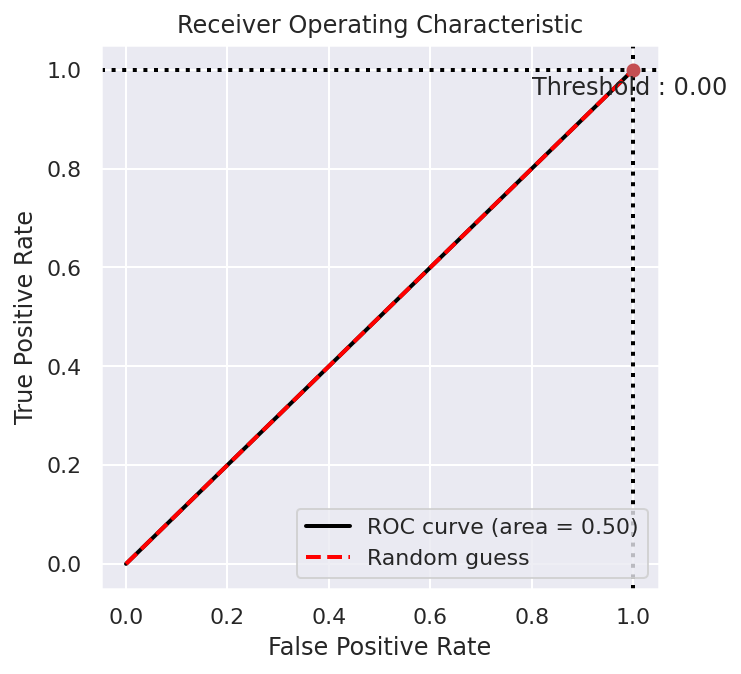

Базовое значение F1: 0.0
Максимизированное значение F1: 0.33881278538812787


In [28]:
dummy_clf = DummyClassifier(strategy="most_frequent")
dummy_clf.fit(train[X], train[y])
proba = dummy_clf.predict_proba(test[y])
metrics(test[y], proba)

### Логистическая регрессия

Обучение на базовой выборке.

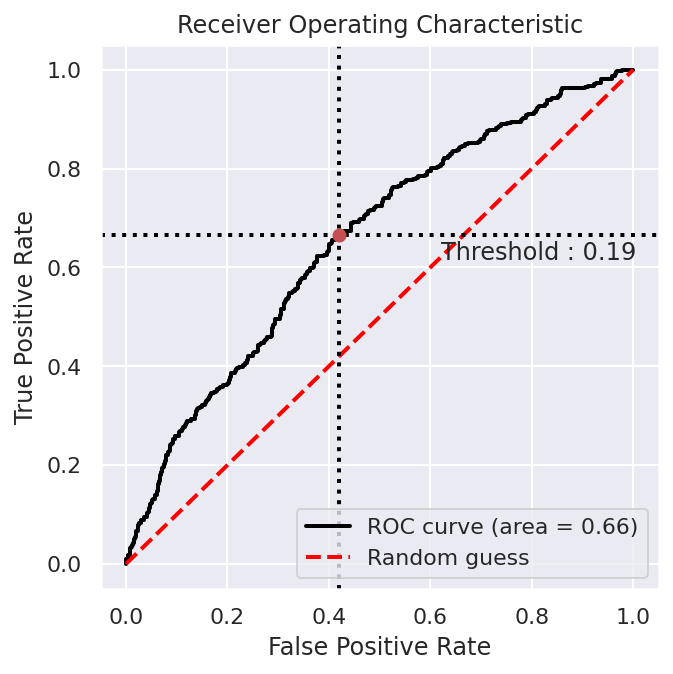

Базовое значение F1: 0.09134615384615384
Максимизированное значение F1: 0.4042553191489362


In [29]:
logres = LogisticRegression(random_state=42)
logres.fit(train[X], train[y])
proba = logres.predict_proba(val[X])
metrics(val[y], proba)

Обучение на базовой выборке с установокой весов классов.

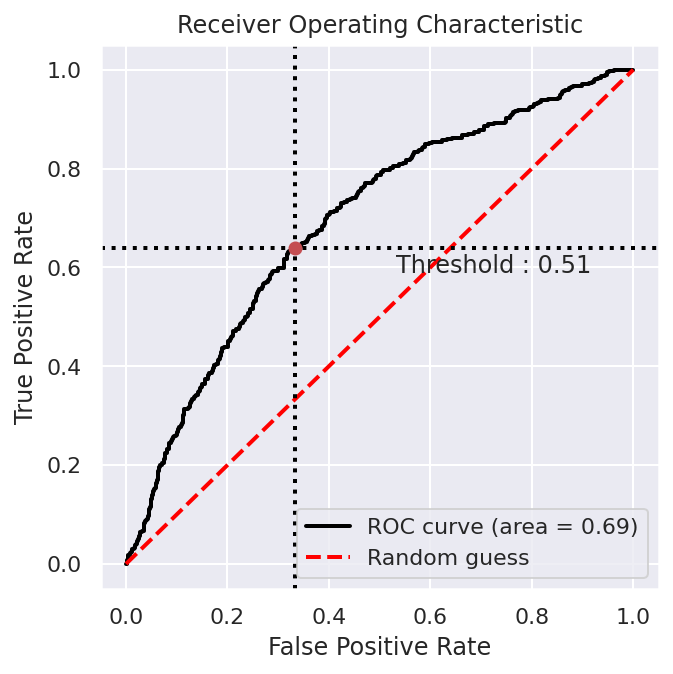

Базовое значение F1: 0.4306306306306306
Максимизированное значение F1: 0.4344637946837763


In [30]:
logres = LogisticRegression(random_state=42, class_weight='balanced')
logres.fit(train[X], train[y])
proba = logres.predict_proba(val[X])
metrics(val[y], proba)

Обучение на базовой выборке на 3 фичах с наибольшей корреляцией с целевым признаком.

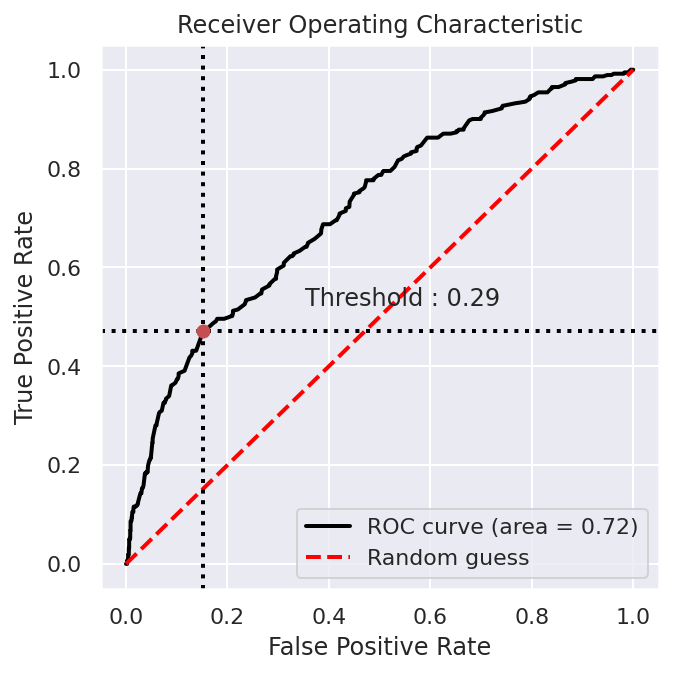

Базовое значение F1: 0.1968680089485459
Максимизированное значение F1: 0.4569190600522193


In [31]:
logres = LogisticRegression(random_state=42)
logres.fit(train[X_corr], train[y])
proba = logres.predict_proba(val[X_corr])
metrics(val[y], proba)

Обучение на базовой выборке на 3 фичах с наибольшей корреляцией с целевым признаком с установокой весов классов.

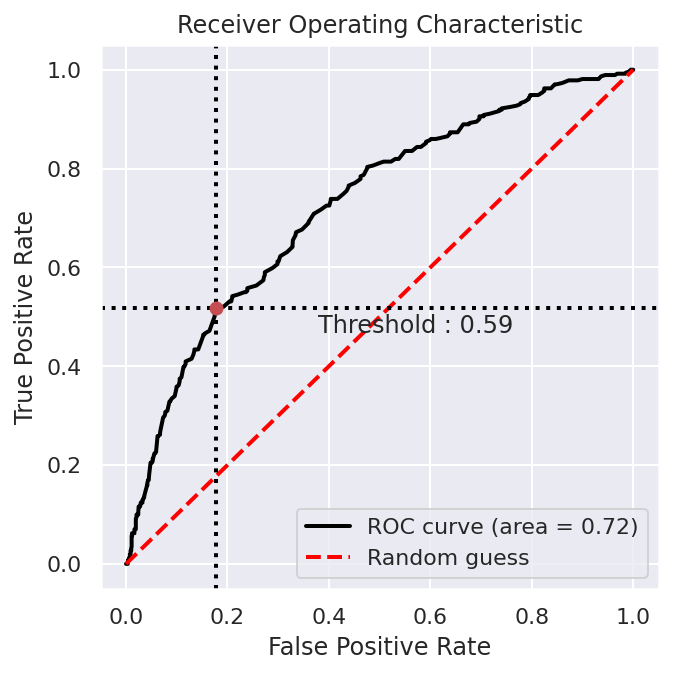

Базовое значение F1: 0.4391143911439114
Максимизированное значение F1: 0.4677222898903776


In [32]:
logres = LogisticRegression(random_state=42, class_weight='balanced')
logres.fit(train[X_corr], train[y])
proba = logres.predict_proba(val[X_corr])
metrics(val[y], proba)

Обучение на овермэмплированной выборке.

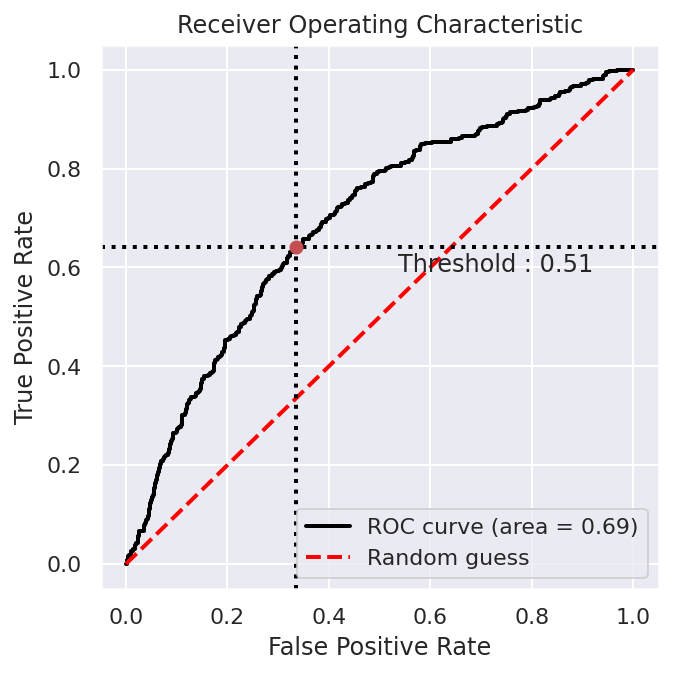

Базовое значение F1: 0.43243243243243246
Максимизированное значение F1: 0.4358974358974359


In [33]:
logres = LogisticRegression(random_state=42)
logres.fit(X_sm, y_sm)
proba = logres.predict_proba(val[X])
metrics(val[y], proba)

Обучение на оверсэмплированной выборке на 3 фичах с наибольшей корреляцией с целевым признаком.

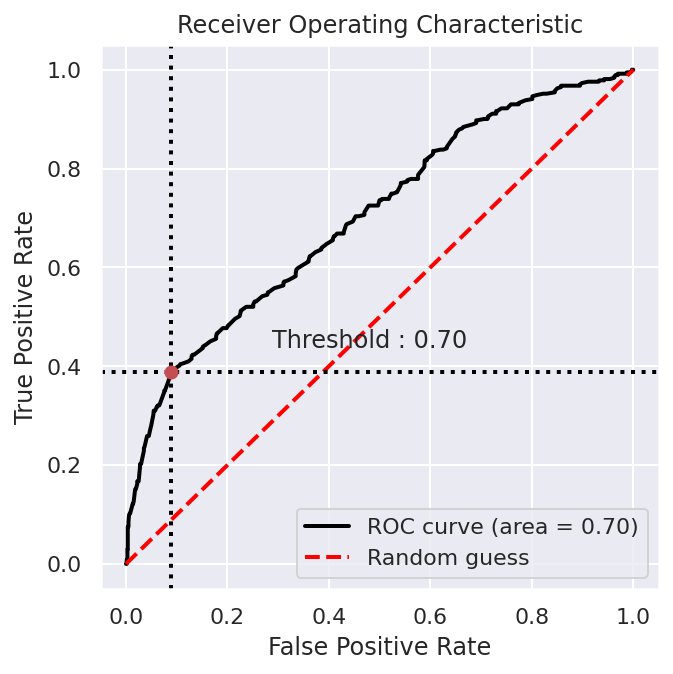

Базовое значение F1: 0.4092664092664092
Максимизированное значение F1: 0.4485981308411215


In [34]:
logres = LogisticRegression(random_state=42)
logres.fit(X_sm[X_corr], y_sm)
proba = logres.predict_proba(val[X_corr])
metrics(val[y], proba)

Обучение на андерсэмплированной выборке на 3 фичах с наибольшей корреляцией с целевым признаком.

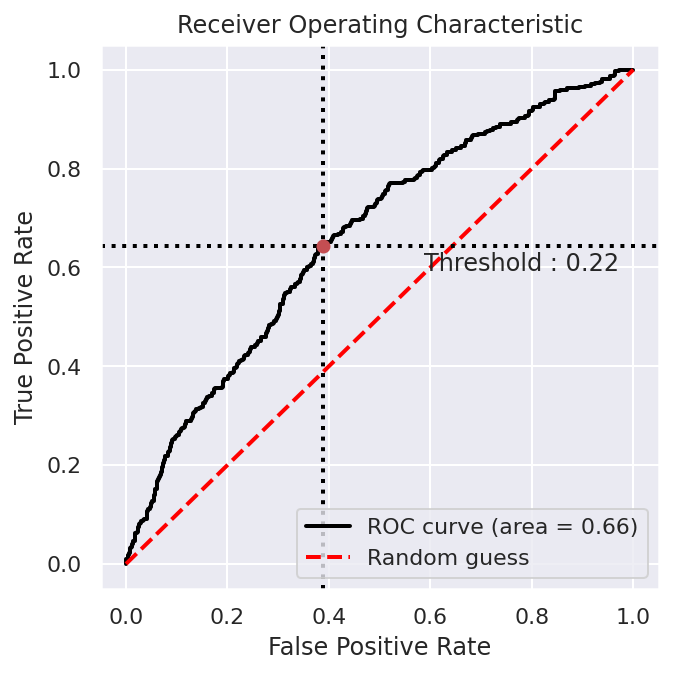

Базовое значение F1: 0.14058956916099774
Максимизированное значение F1: 0.4085470085470085


In [35]:
logres = LogisticRegression(random_state=42)
logres.fit(X_tl, y_tl)
proba = logres.predict_proba(val[X])
metrics(val[y], proba)

Обучение на андерсэмплированной выборке на 3 фичах с наибольшей корреляцией с целевым признаком.

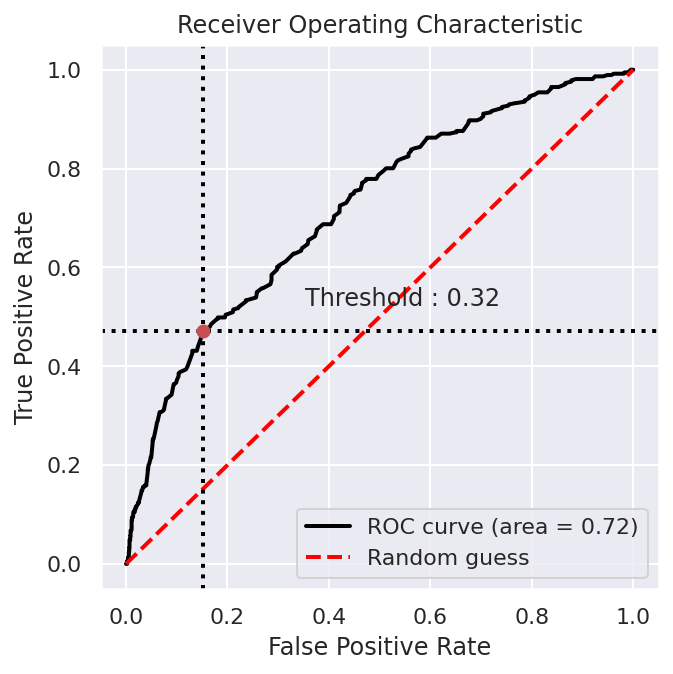

Базовое значение F1: 0.24267782426778245
Максимизированное значение F1: 0.4549019607843137


In [36]:
logres = LogisticRegression(random_state=42)
logres.fit(X_tl[X_corr], y_tl)
proba = logres.predict_proba(val[X_corr])
metrics(val[y], proba)

Наилучший результат показала логистическая регрессия на базовой выборке на 3 фичах с наибольшей корреляцией с целевым признаком с установокой весов классов попробуем также масштабировать подаваемые данные.

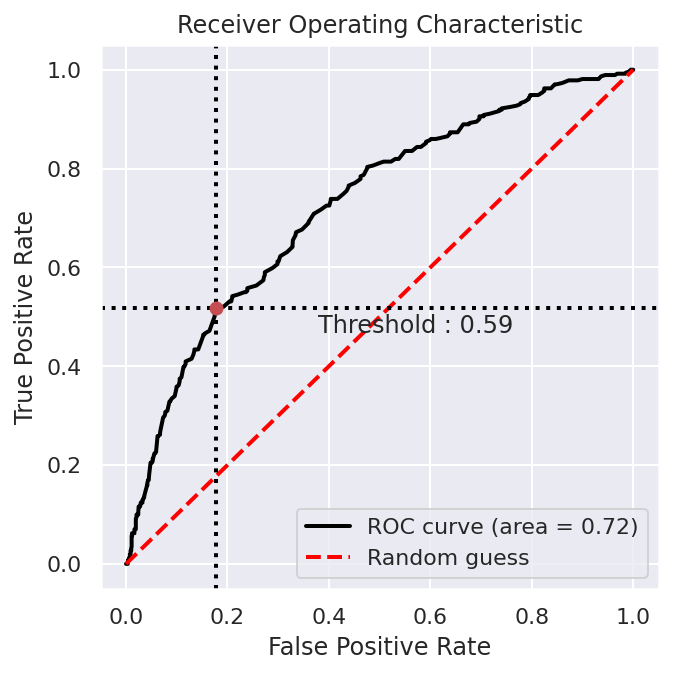

Базовое значение F1: 0.4391143911439114
Максимизированное значение F1: 0.4677222898903776


In [37]:
logres_pipe = Pipeline([('scaler', StandardScaler()),
                       ('logres', LogisticRegression(random_state=42, class_weight='balanced'))])
logres_pipe.fit(train[X_corr], train[y])
proba = logres_pipe.predict_proba(val[X_corr])
metrics(val[y], proba)

Результат не изменился, останавливаемся на логистической регрессии на базовой выборке на 3 фичах с наибольшей корреляцией с целевым признаком с установокой весов классов. Проверим ее качество на тестовой выборке с порогом 0.59.

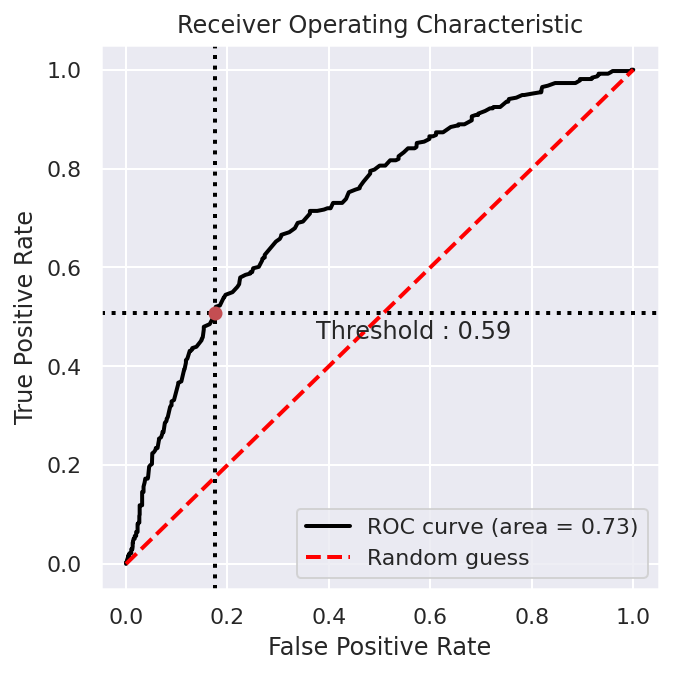

Базовое значение F1: 0.4649375600384246
Максимизированное значение F1: 0.46115906288532676


In [38]:
logres = LogisticRegression(random_state=42, class_weight='balanced')
logres.fit(train_full[X_corr], train_full[y])
proba = logres.predict_proba(test[X_corr])
metrics(test[y], proba, threshold=0.59)

### Метод k-ближайших соседей

In [39]:
# Создаем пайплайн для масштабирования данных при кроссвалидации
knn_pipe = Pipeline([('scaler', StandardScaler()), ('knn', KNeighborsClassifier(n_jobs=-1))])
# Устанавливаем гиперпараметры для перебора
knn_params = {'knn__n_neighbors': range(1, 30)}
# Создаем объект StratifiedKFold для улучшения реультата при кроссвалидации
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

knn_grid = GridSearchCV(knn_pipe, knn_params, cv=skf, n_jobs=-1, verbose=1, scoring='f1')

Обучение на базовой выборке.

Fitting 5 folds for each of 29 candidates, totalling 145 fits


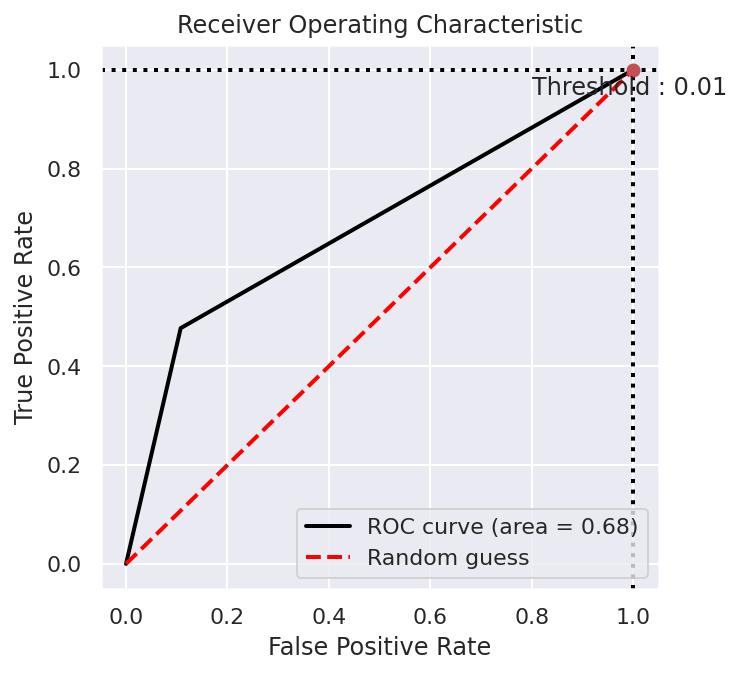

Базовое значение F1: 0.5028409090909092
Максимизированное значение F1: 0.5028409090909092


In [40]:
knn_grid.fit(train[X], train[y])
proba = knn_grid.predict_proba(val[X])
metrics(val[y], proba)

Обучение на андерсэмплированной выборке на 3 фичах с наибольшей корреляцией с целевым признаком.

Fitting 5 folds for each of 29 candidates, totalling 145 fits


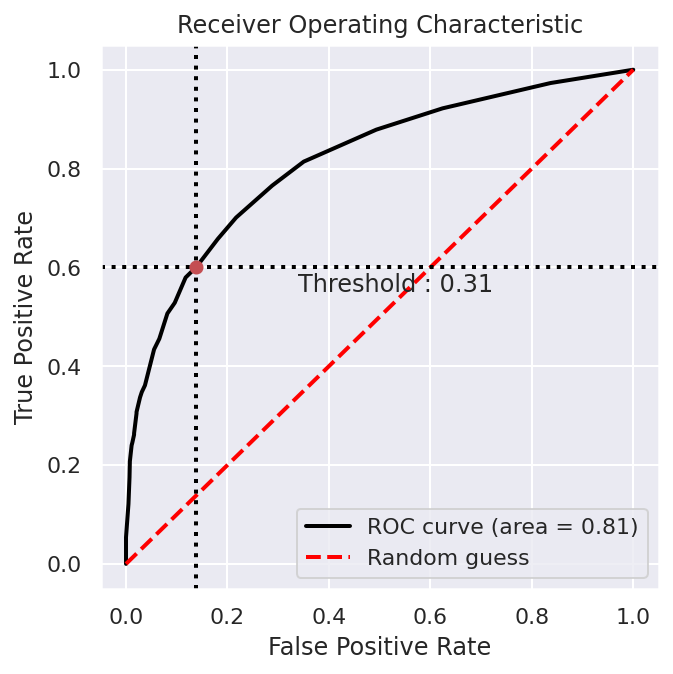

Базовое значение F1: 0.5261437908496732
Максимизированное значение F1: 0.5687830687830688


In [41]:
knn_grid.fit(train[X_corr], train[y])
proba = knn_grid.predict_proba(val[X_corr])
metrics(val[y], proba)

Обучение на андерсэмплированной выборке.

Fitting 5 folds for each of 29 candidates, totalling 145 fits


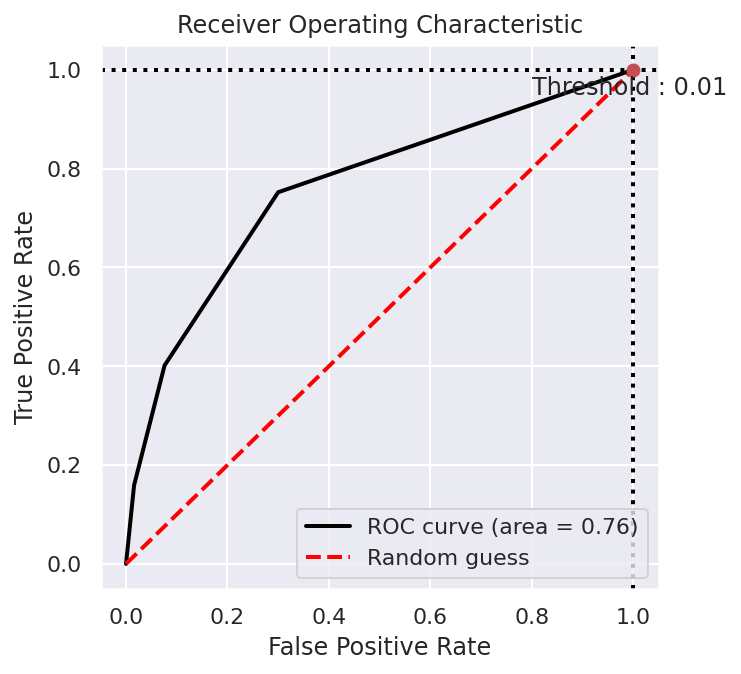

Базовое значение F1: 0.473015873015873
Максимизированное значение F1: 0.5147601476014759


In [42]:
knn_grid.fit(X_tl, y_tl)
proba = knn_grid.predict_proba(val[X])
metrics(val[y], proba)

Обучение на андерсэмплированной выборке на 3 фичах с наибольшей корреляцией с целевым признаком.

Fitting 5 folds for each of 29 candidates, totalling 145 fits


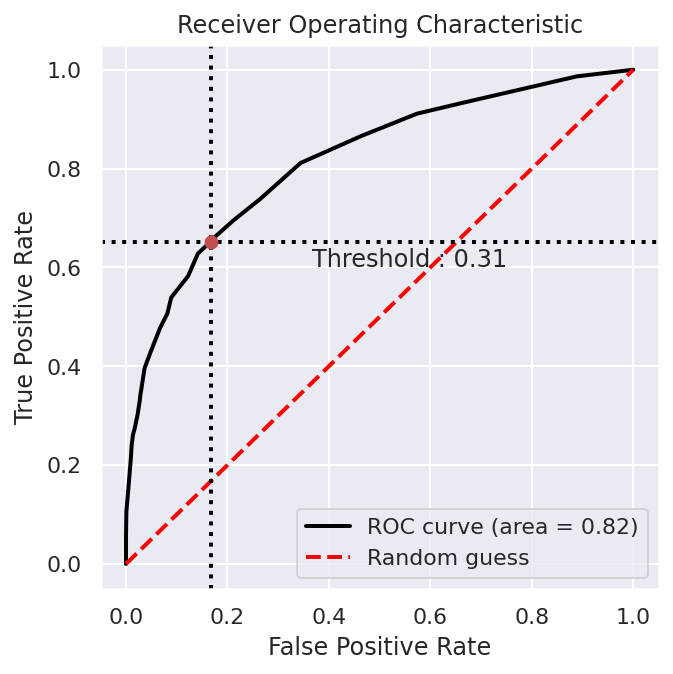

Базовое значение F1: 0.5299999999999999
Максимизированное значение F1: 0.5760197775030903


In [43]:
knn_grid.fit(X_tl[X_corr], y_tl)
proba = knn_grid.predict_proba(val[X_corr])
metrics(val[y], proba)

In [44]:
# Создаем пайплайн для масштабирования данных и оверсэмплирования при кроссвалидации
imba_pipeline = Pipeline([('smote', SMOTE(random_state=42)), 
                          ('scaler', StandardScaler()), ('knn', KNeighborsClassifier(n_jobs=-1))])

grid_imba = GridSearchCV(imba_pipeline, param_grid=knn_params, cv=skf, scoring='f1',
                        return_train_score=True)

Обучение с оверсэмплированием.

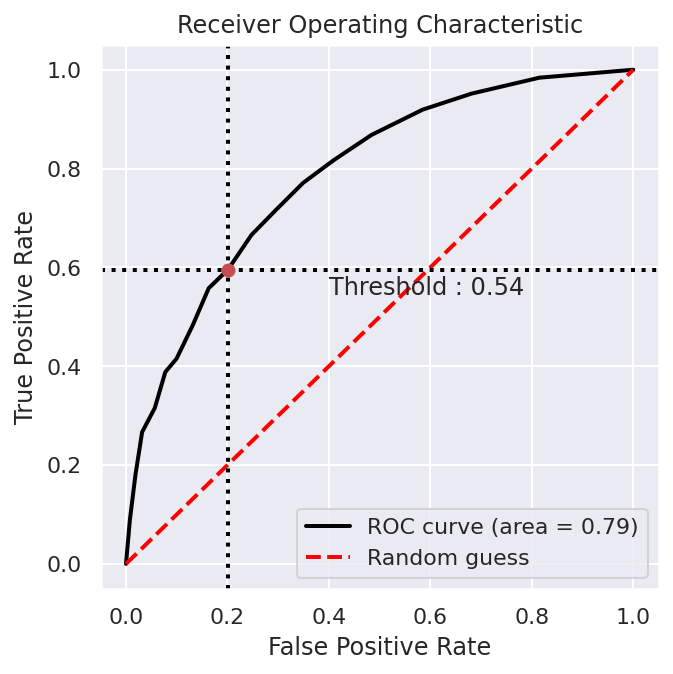

Базовое значение F1: 0.5005662514156285
Максимизированное значение F1: 0.5085995085995085


In [45]:
grid_imba.fit(train[X], train[y])
proba = grid_imba.predict_proba(val[X])
metrics(val[y], proba)

Обучение с оверсэмплированием на 3 фичах с наибольшей корреляцией с целевым признаком.

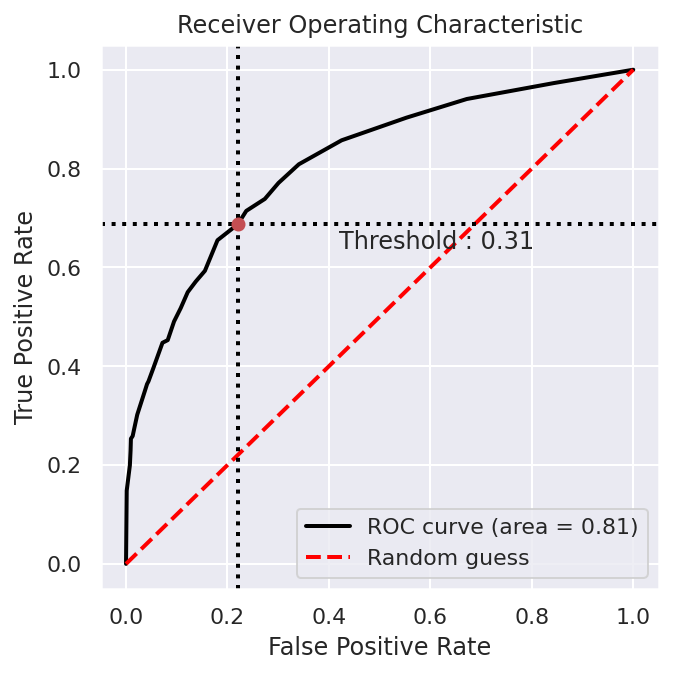

Базовое значение F1: 0.527536231884058
Максимизированное значение F1: 0.5554285714285714


In [46]:
grid_imba.fit(train[X_corr], train[y])
proba = grid_imba.predict_proba(val[X_corr])
metrics(val[y], proba)

Наилучший результат Метод k-ближайших соседей показал на андерсэмплированной выборке на 3 фичах с наибольшей корреляцией с целевым признаком. Проверим ее качество на тестовой выборке с порогом 0.31.

Fitting 5 folds for each of 29 candidates, totalling 145 fits


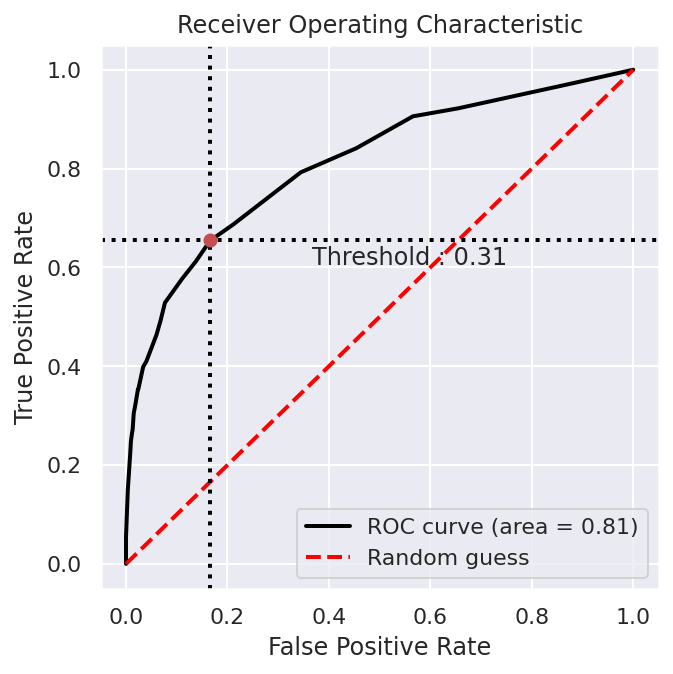

Базовое значение F1: 0.5232358003442341
Максимизированное значение F1: 0.5684210526315789


In [47]:
knn_grid.fit(X_tl[X_corr], y_tl)
proba = knn_grid.predict_proba(test[X_corr])
metrics(test[y], proba, 0.31)

### Метод опорных векторов

In [48]:
# Создаем пайплайн для масштабирования данных
imba_pipeline = Pipeline([('scaler', StandardScaler()), 
                          ('svc', SVC(probability=True, class_weight="balanced"))])

Обучение на базовой выборке.

In [49]:
imba_pipeline.fit(train[X], train[y])

Pipeline(steps=[('scaler', StandardScaler()),
                ('svc', SVC(class_weight='balanced', probability=True))])

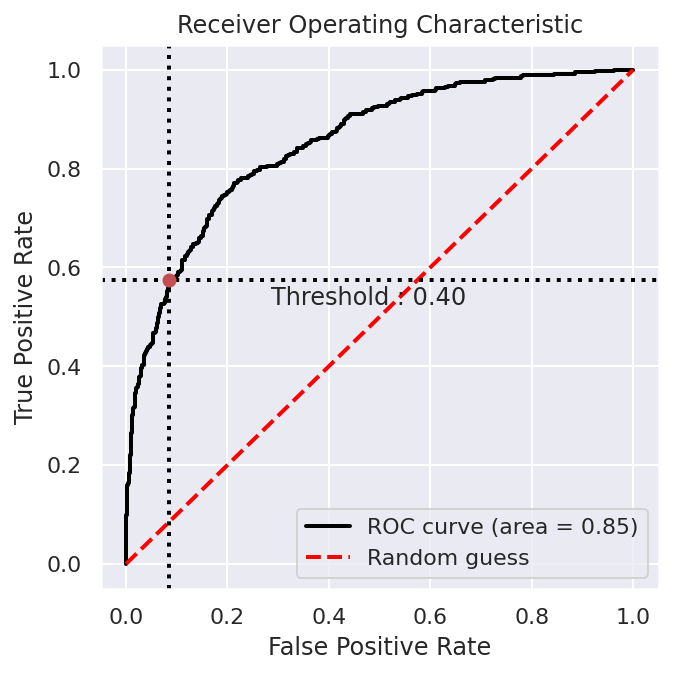

Базовое значение F1: 0.5415986949429037
Максимизированное значение F1: 0.6025459688826025


In [50]:
proba = imba_pipeline.predict_proba(val[X])
metrics(val[y], proba)

Обучение на андерсэмплированной выборке.

In [51]:
imba_pipeline.fit(X_tl, y_tl)

Pipeline(steps=[('scaler', StandardScaler()),
                ('svc', SVC(class_weight='balanced', probability=True))])

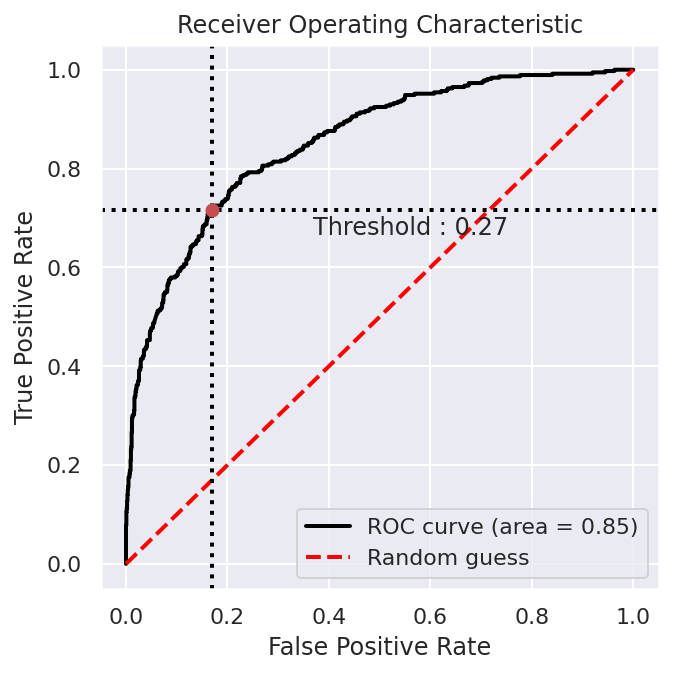

Базовое значение F1: 0.5811437403400309
Максимизированное значение F1: 0.6066134549600912


In [52]:
proba = imba_pipeline.predict_proba(val[X])
metrics(val[y], proba)

In [53]:
# Создаем пайплайн для масштабирования данных и оверсэмплирования
imba_pipeline_sm = Pipeline([('smote', SMOTE(random_state=42)), 
                           ('scaler', StandardScaler()), 
                           ('svc', SVC(probability=True))])

Обучение с оверсэмплированием на базовой выборке.

In [54]:
imba_pipeline_sm.fit(train[X], train[y])

Pipeline(steps=[('smote', SMOTE(random_state=42)), ('scaler', StandardScaler()),
                ('svc', SVC(probability=True))])

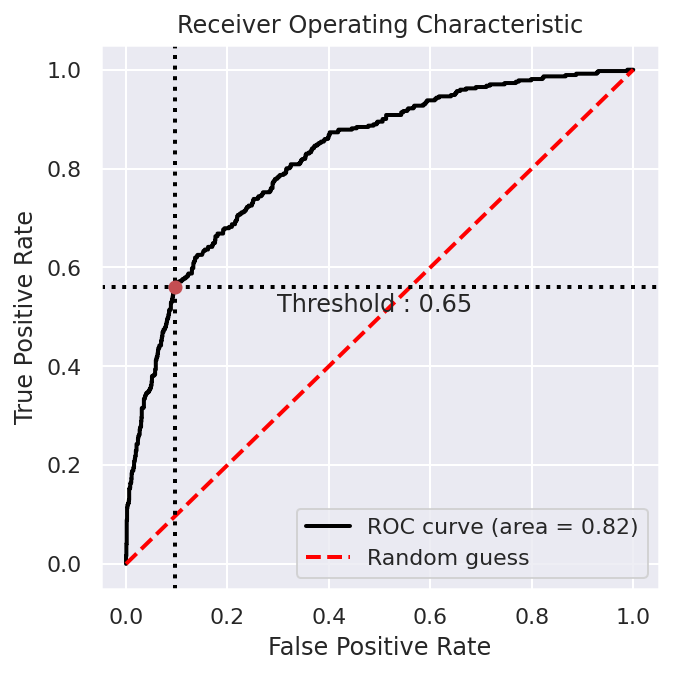

Базовое значение F1: 0.5683192261185006
Максимизированное значение F1: 0.5793871866295265


In [55]:
proba = imba_pipeline_sm.predict_proba(val[X])
metrics(val[y], proba)

Обучение с оверсэмплированием на андерсэмплированной выборке.

In [56]:
imba_pipeline_sm.fit(X_tl, y_tl)

Pipeline(steps=[('smote', SMOTE(random_state=42)), ('scaler', StandardScaler()),
                ('svc', SVC(probability=True))])

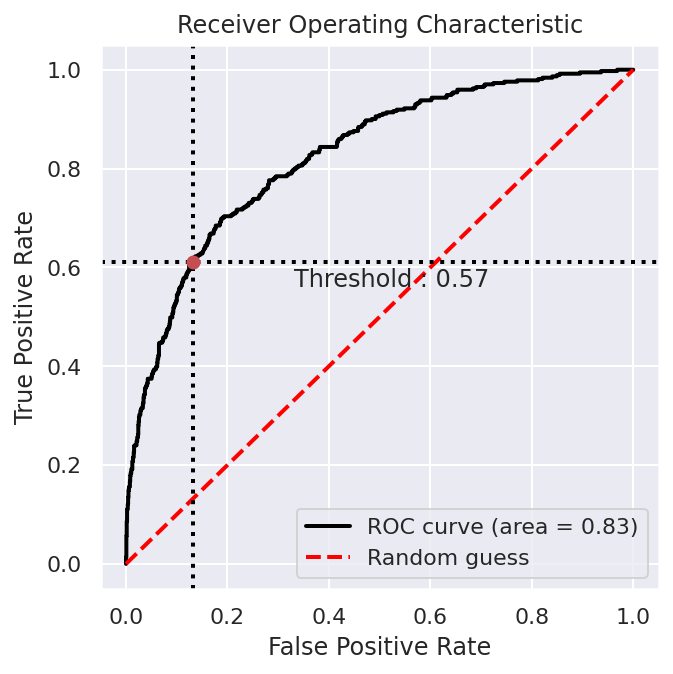

Базовое значение F1: 0.5693606755126658
Максимизированное значение F1: 0.5790816326530611


In [57]:
proba = imba_pipeline_sm.predict_proba(val[X])
metrics(val[y], proba)

Наилучший результат метод опорных векторов показал на андерсэмплированной выборке. Проверим качество данной модели на тестовой выборке с порогом 0.28.

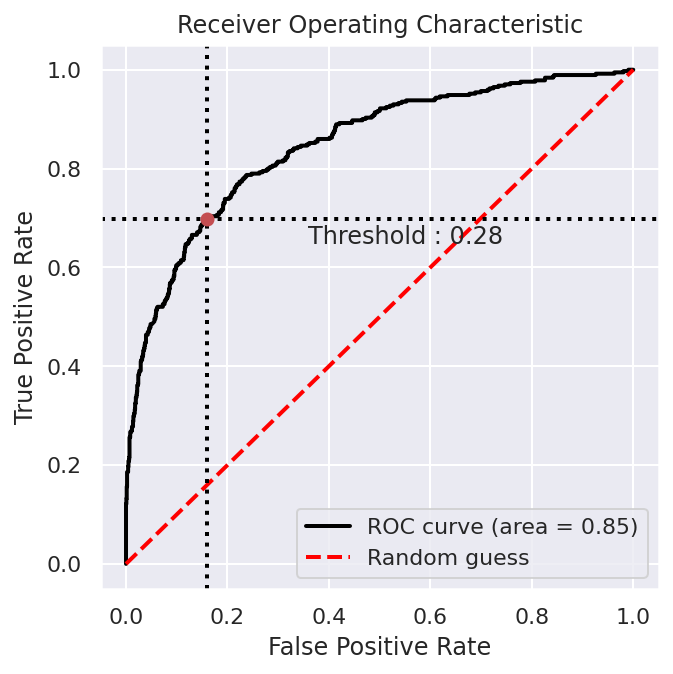

Базовое значение F1: 0.5741324921135648
Максимизированное значение F1: 0.6009280742459396


In [58]:
imba_pipeline.fit(X_tl, y_tl)
proba = imba_pipeline.predict_proba(test[X])
metrics(test[y], proba, 0.28)

### Метод случайного леса

In [59]:
forest = RandomForestClassifier(random_state=42)
# Устанавливаем гиперпараметры для перебора
forest_params = {'n_estimators': [50, 100, 200],
                 'max_depth': [4, 6, 10, 12],
                 'min_samples_leaf': [4, 6, 10, 12],
                 'class_weight': [None, 'balanced']}
# Создаем объект StratifiedKFold для улучшения реультата при кроссвалидации
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

forest_grid = GridSearchCV(forest, param_grid=forest_params, cv=skf, verbose=1, scoring='f1')

Обучение на базовой выборке.

Fitting 5 folds for each of 96 candidates, totalling 480 fits


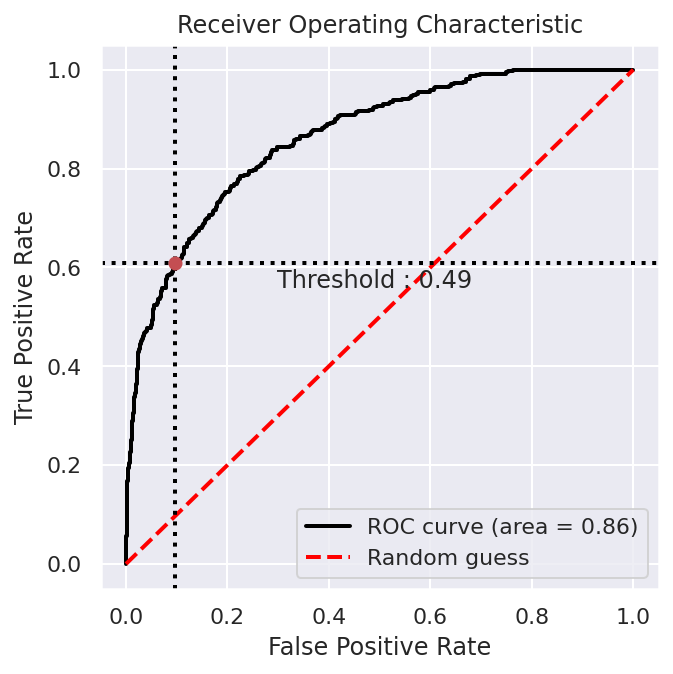

Базовое значение F1: 0.606060606060606
Максимизированное значение F1: 0.6141304347826086
{'class_weight': 'balanced', 'max_depth': 12, 'min_samples_leaf': 4, 'n_estimators': 200}


In [60]:
forest_grid.fit(train[X], train[y])
proba = forest_grid.predict_proba(val[X])
metrics(val[y], proba)
print(forest_grid.best_params_)

Обучение на аднерсэмплированной выборке.

Fitting 5 folds for each of 96 candidates, totalling 480 fits


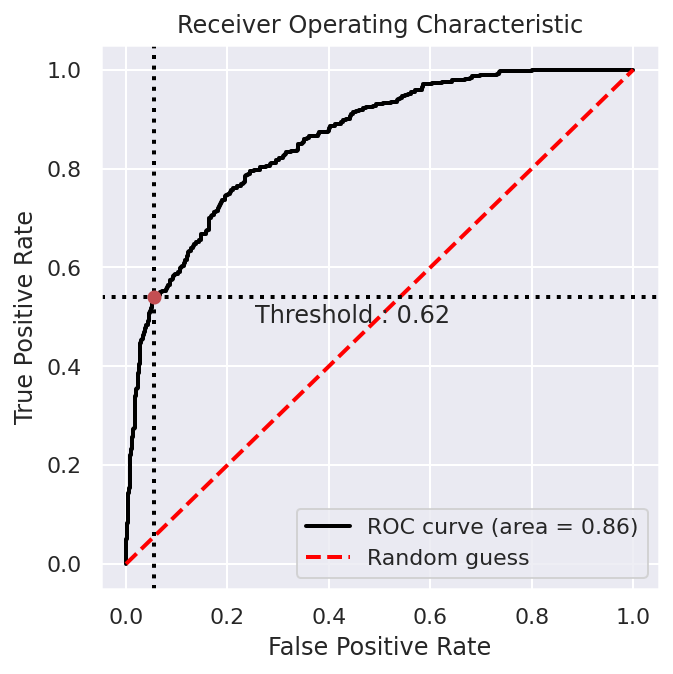

Базовое значение F1: 0.5969387755102041
Максимизированное значение F1: 0.6134969325153374
{'class_weight': 'balanced', 'max_depth': 12, 'min_samples_leaf': 6, 'n_estimators': 50}


In [61]:
forest_grid.fit(X_tl, y_tl)
proba = forest_grid.predict_proba(val[X])
metrics(val[y], proba)
print(forest_grid.best_params_)

In [62]:
# Создаем пайплайн для оверсэмплирования данных при кроссвалидации
imba_pipeline_sm = Pipeline([('scaler', StandardScaler()), 
                             ('smote', SMOTE(random_state=42)),
                             ('forest', RandomForestClassifier(random_state=42))])

forest_params = {'forest__n_estimators': [50, 100, 200],
                 'forest__max_depth': [5, 10, 12, 16],
                 'forest__min_samples_leaf': [1, 4, 6, 10],
                 'forest__class_weight': [None, 'balanced']}

forest_grid_sm = GridSearchCV(imba_pipeline_sm, param_grid=forest_params, cv=skf, scoring='f1')

Обучение с масштабированием на базовой выборке.

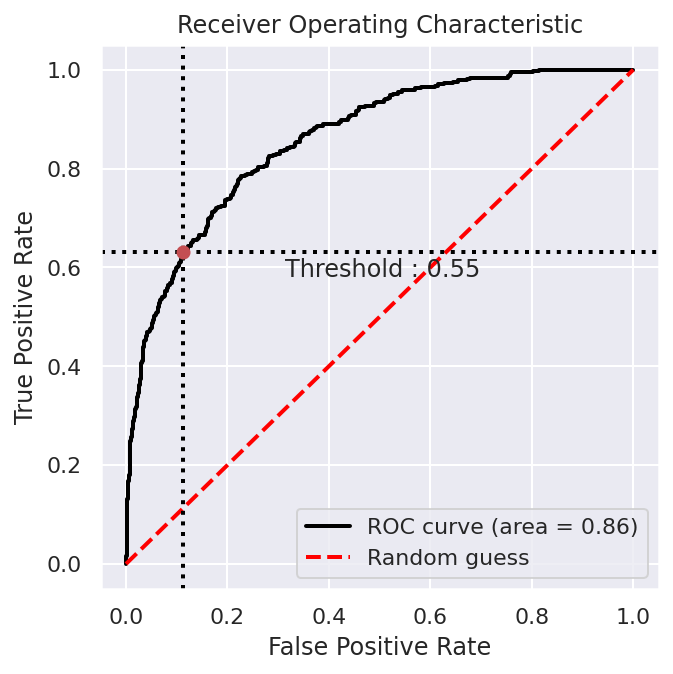

Базовое значение F1: 0.5968331303288672
Максимизированное значение F1: 0.607561929595828
{'forest__class_weight': None, 'forest__max_depth': 10, 'forest__min_samples_leaf': 4, 'forest__n_estimators': 50}


In [64]:
forest_grid_sm.fit(train[X], train[y])
proba = forest_grid_sm.predict_proba(val[X])
metrics(val[y], proba)
print(forest_grid_sm.best_params_)

Обучение с масштабированием на андерсэмплированной выборке.

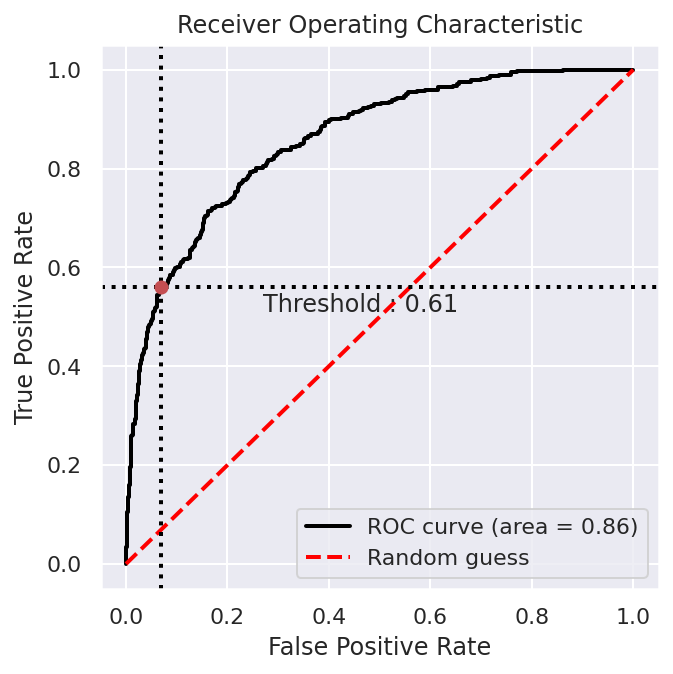

Базовое значение F1: 0.5934861278648975
Максимизированное значение F1: 0.609720176730486
{'forest__class_weight': None, 'forest__max_depth': 12, 'forest__min_samples_leaf': 6, 'forest__n_estimators': 200}


In [65]:
forest_grid_sm.fit(X_tl, y_tl)
proba = forest_grid_sm.predict_proba(val[X])
metrics(val[y], proba)
print(forest_grid_sm.best_params_)

Наилучший результат метод случайного леса показал на базовой выборке. Проверим качество данной модели с найденными гиперпараметрами на тестовой выборке с порогом 0.49.

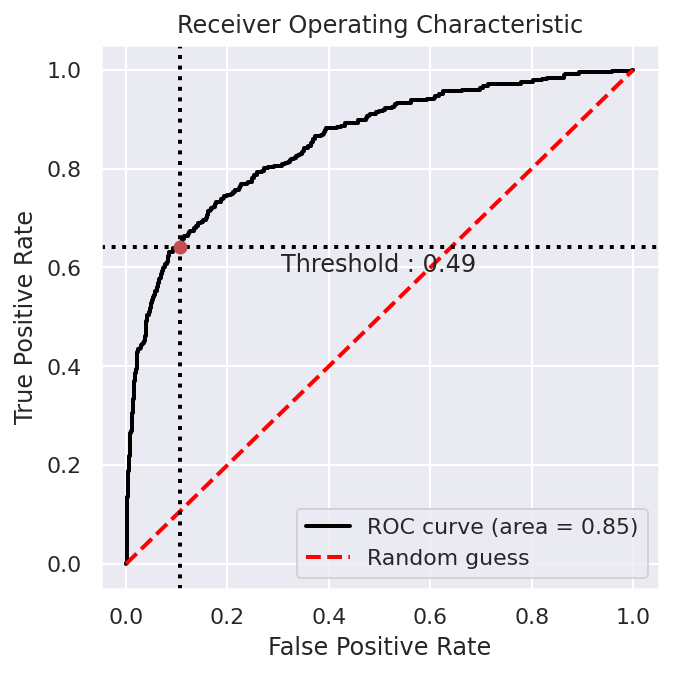

Базовое значение F1: 0.6303191489361702
Максимизированное значение F1: 0.6263157894736843


In [66]:
params = {'class_weight': 'balanced', 
          'max_depth': 12, 
          'min_samples_leaf': 4, 
          'n_estimators': 200,
          'random_state': 42}

forest = RandomForestClassifier(**params)

forest.fit(train_full[X], train_full[y])
proba = forest.predict_proba(test[X])
metrics(test[y], proba, 0.49)

### Градиентный бустинг

In [67]:
# Определяем гиперпараметры модели
params = {'verbose': 100,
          'random_seed': 42,
          'learning_rate':0.01,
          'custom_loss': ['AUC', 'F1']}
# Создаем модель с заданным параметрами
model_base = CatBoostClassifier(**params)
# Обучаем на базовой выборке
model_base.fit(train[X], train[y], eval_set=(val[X], val[y]), plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6846447	test: 0.6847850	best: 0.6847850 (0)	total: 49.1ms	remaining: 49s
100:	learn: 0.3809070	test: 0.3907355	best: 0.3907355 (100)	total: 271ms	remaining: 2.41s
200:	learn: 0.3364173	test: 0.3511835	best: 0.3511835 (200)	total: 498ms	remaining: 1.98s
300:	learn: 0.3207796	test: 0.3390735	best: 0.3390735 (300)	total: 767ms	remaining: 1.78s
400:	learn: 0.3107928	test: 0.3325298	best: 0.3325298 (400)	total: 1s	remaining: 1.5s
500:	learn: 0.3033149	test: 0.3294938	best: 0.3294938 (500)	total: 1.25s	remaining: 1.24s
600:	learn: 0.2965309	test: 0.3273768	best: 0.3273658 (599)	total: 1.51s	remaining: 1s
700:	learn: 0.2902379	test: 0.3265943	best: 0.3265943 (700)	total: 1.75s	remaining: 747ms
800:	learn: 0.2844445	test: 0.3259131	best: 0.3258948 (799)	total: 1.99s	remaining: 495ms
900:	learn: 0.2787110	test: 0.3249401	best: 0.3249371 (898)	total: 2.24s	remaining: 247ms
999:	learn: 0.2732551	test: 0.3246573	best: 0.3245367 (981)	total: 2.46s	remaining: 0us

bestTest = 0.3245367427

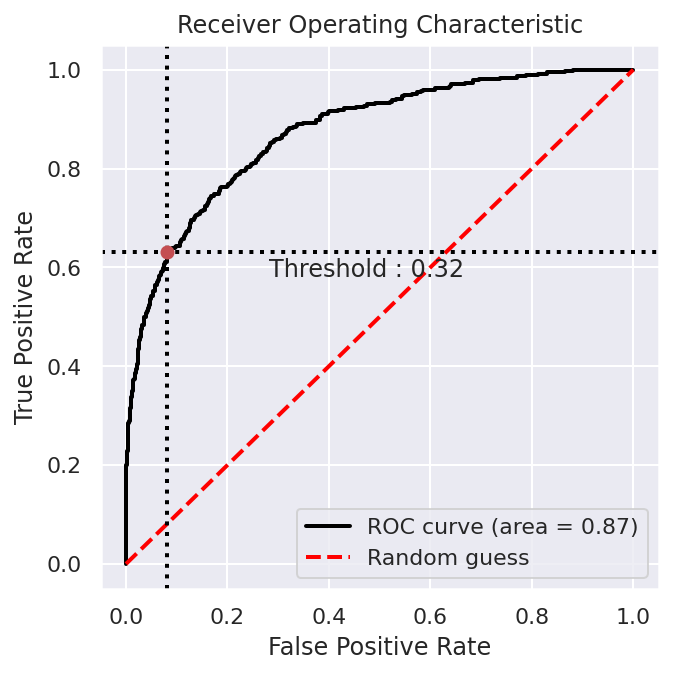

Базовое значение F1: 0.5827586206896552
Максимизированное значение F1: 0.6454293628808864


In [68]:
proba = model_base.predict_proba(val[X])
metrics(val[y], proba)

In [69]:
# Определяем гиперпараметры модели
params = {'verbose': 100,
          'random_seed': 42,
          'learning_rate':0.01,
          'custom_loss': ['AUC', 'F1']}
# Создаем модель с заданным параметрами
model_tl = CatBoostClassifier(**params)
# Обучаем на андерсэмплированной выборке
model_tl.fit(X_tl, y_tl, eval_set=(val[X], val[y]), plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6867945	test: 0.6867690	best: 0.6867690 (0)	total: 2.36ms	remaining: 2.35s
100:	learn: 0.3984491	test: 0.3963655	best: 0.3963655 (100)	total: 220ms	remaining: 1.95s
200:	learn: 0.3532895	test: 0.3539844	best: 0.3539844 (200)	total: 431ms	remaining: 1.71s
300:	learn: 0.3367002	test: 0.3399393	best: 0.3399393 (300)	total: 673ms	remaining: 1.56s
400:	learn: 0.3260197	test: 0.3336664	best: 0.3336664 (400)	total: 893ms	remaining: 1.33s
500:	learn: 0.3175021	test: 0.3298189	best: 0.3298189 (500)	total: 1.12s	remaining: 1.12s
600:	learn: 0.3101149	test: 0.3279068	best: 0.3278506 (597)	total: 1.39s	remaining: 921ms
700:	learn: 0.3036292	test: 0.3266842	best: 0.3266842 (700)	total: 1.6s	remaining: 683ms
800:	learn: 0.2971832	test: 0.3264044	best: 0.3261638 (772)	total: 1.82s	remaining: 452ms
900:	learn: 0.2907660	test: 0.3260906	best: 0.3260692 (883)	total: 2.03s	remaining: 224ms
999:	learn: 0.2847735	test: 0.3259724	best: 0.3258689 (936)	total: 2.3s	remaining: 0us

bestTest = 0.325

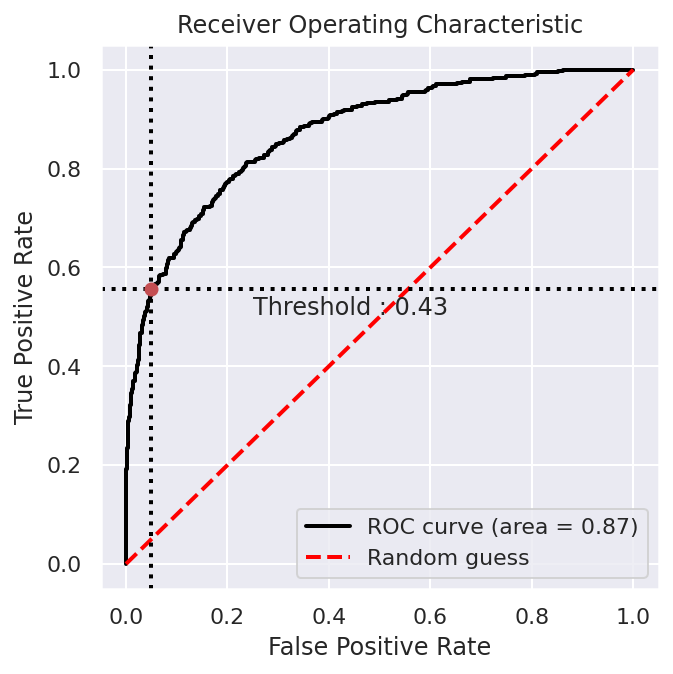

Базовое значение F1: 0.5973154362416108
Максимизированное значение F1: 0.6348228043143297


In [70]:
proba = model_tl.predict_proba(val[X])
metrics(val[y], proba)

Градиентный бустинг показал наилучший результат на базовой выборке. Проверим качество данной модели на тестовой выборке с порогом 0.32.

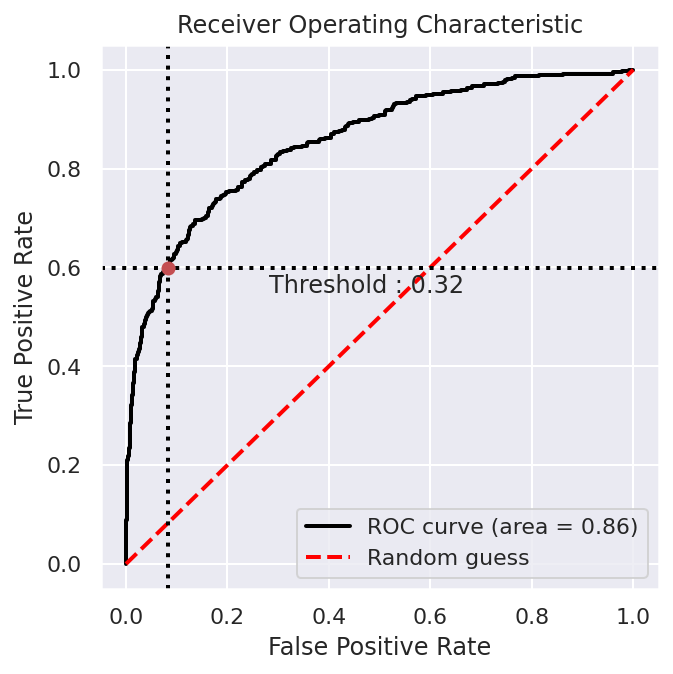

Базовое значение F1: 0.5826235093696762
Максимизированное значение F1: 0.6218487394957982


In [71]:
proba = model_base.predict_proba(test[X])
metrics(test[y], proba, 0.32)

В конце обучим модель градиентного бустинга на сырых данных без какой-либо обработки.

In [72]:
# Разбиваем копию исходного датафрема
train, test = train_test_split(data, train_size=0.6, random_state=42, stratify=data['Exited'])
val, test = train_test_split(test, train_size=0.5, random_state=42, stratify=test['Exited'])
# Определяем фичи для обучения
X = ['CustomerId', 'CreditScore', 'Geography', 'Gender', 'Age', 
     'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
     'IsActiveMember', 'EstimatedSalary']
# Определяем категориальные фичи
cat_features = ['Geography','Gender']
# Определяем целевой признак
y = ['Exited']
# Готовим тренировочные данные 
train_data = Pool(data=train[X],
                  label=train[y],
                  cat_features=cat_features)
# Готовим валидационные данные 
valid_data = Pool(data=val[X],
                  label=val[y],
                  cat_features=cat_features)
# Определяем гиперпараметры модели
params = {'verbose': 100,
          'random_seed': 42,
          'learning_rate':0.01,
          'custom_loss': ['AUC', 'F1']}
# Создаем модель с заданным параметрами
model = CatBoostClassifier(**params)

In [73]:
model.fit(train_data, eval_set=valid_data, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6848575	test: 0.6849145	best: 0.6849145 (0)	total: 8.22ms	remaining: 8.21s
100:	learn: 0.3905827	test: 0.3892610	best: 0.3892610 (100)	total: 649ms	remaining: 5.78s
200:	learn: 0.3458128	test: 0.3445028	best: 0.3445028 (200)	total: 1.28s	remaining: 5.08s
300:	learn: 0.3298109	test: 0.3306153	best: 0.3306153 (300)	total: 1.9s	remaining: 4.41s
400:	learn: 0.3207279	test: 0.3251406	best: 0.3251406 (400)	total: 2.47s	remaining: 3.69s
500:	learn: 0.3135211	test: 0.3220933	best: 0.3220933 (500)	total: 3.06s	remaining: 3.05s
600:	learn: 0.3070943	test: 0.3201917	best: 0.3201917 (600)	total: 3.66s	remaining: 2.43s
700:	learn: 0.3016289	test: 0.3191181	best: 0.3191128 (690)	total: 4.25s	remaining: 1.81s
800:	learn: 0.2962844	test: 0.3183002	best: 0.3181847 (781)	total: 4.81s	remaining: 1.2s
900:	learn: 0.2904010	test: 0.3179401	best: 0.3178832 (891)	total: 5.41s	remaining: 595ms
999:	learn: 0.2846103	test: 0.3180245	best: 0.3178220 (932)	total: 6.07s	remaining: 0us

bestTest = 0.317

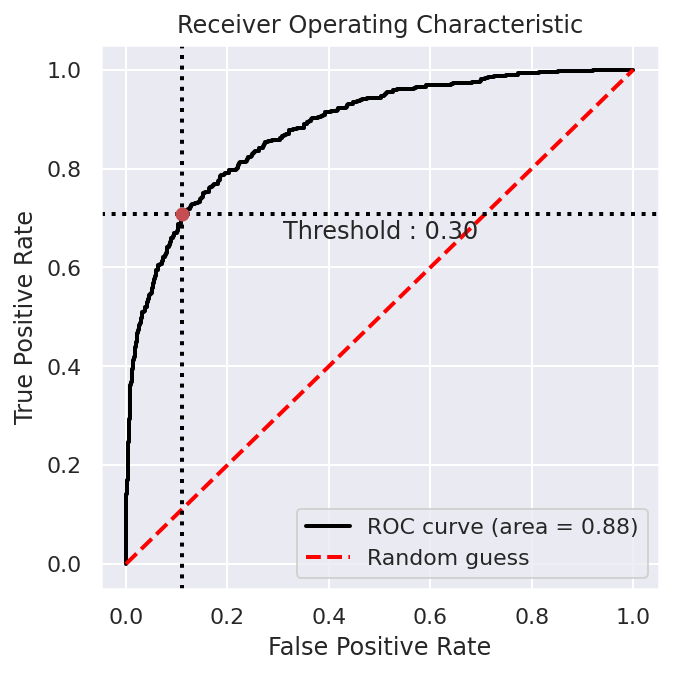

Базовое значение F1: 0.6235294117647059
Максимизированное значение F1: 0.6598173515981735


In [74]:
proba = model.predict_proba(val[X])
metrics(val[y], proba)

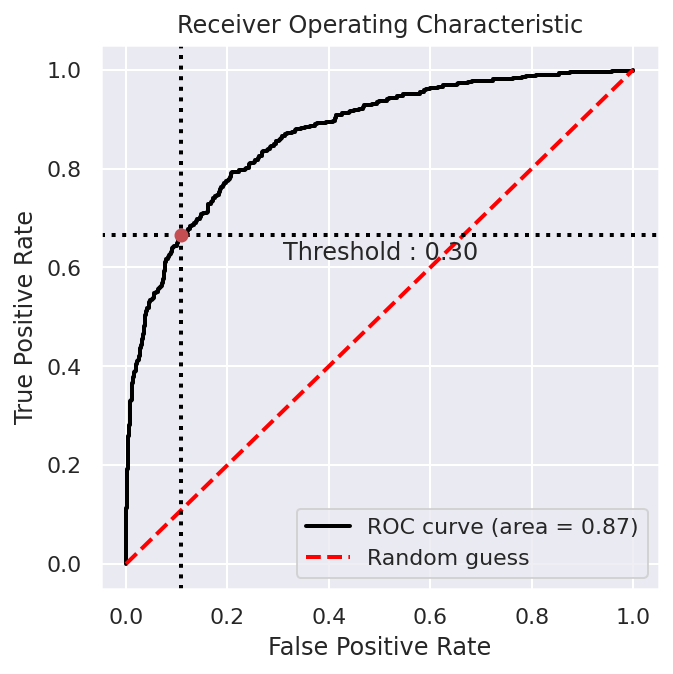

Базовое значение F1: 0.5828220858895705
Максимизированное значение F1: 0.6324387397899651


In [75]:
proba = model.predict_proba(test[X])
metrics(test[y], proba, 0.30)

### Интерпретация (дополнение)

В дополнение посмторим на влияние признаков на выбор последней модели (градиентный бустинг на сырых данных).

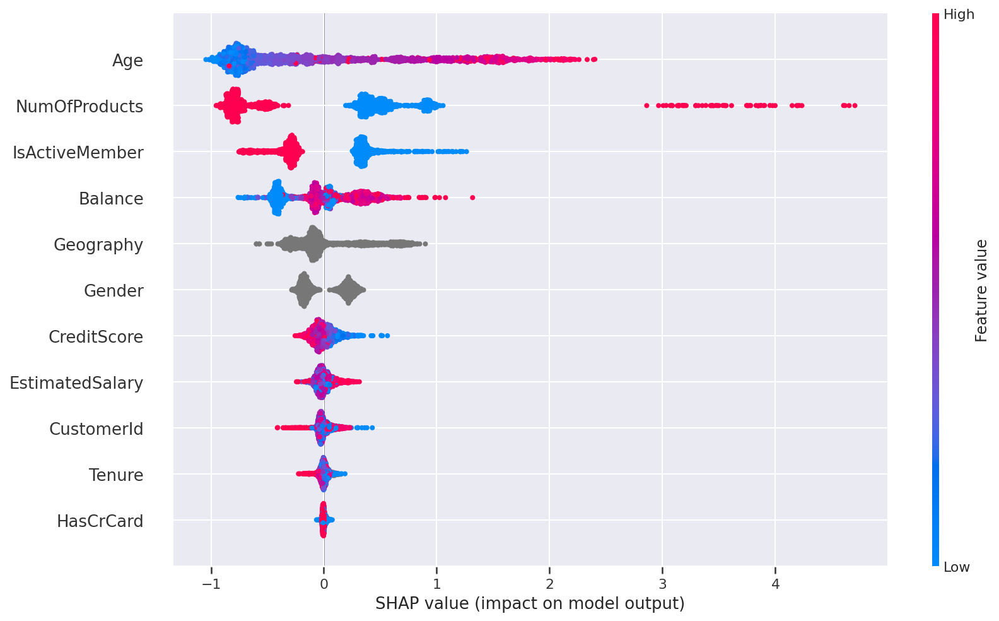

In [76]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(test[X])
shap.summary_plot(shap_values, test[X], plot_size=(12, 7))

Как мы видим, самые важные признаки - `Age`, `NumOfProducts`, `IsActiveMember`. Из неожиданного - `CustomerId` похоже имеет значимость, хоть и очень небольшую.

Можем также оценить влияние данных фичей на результат:

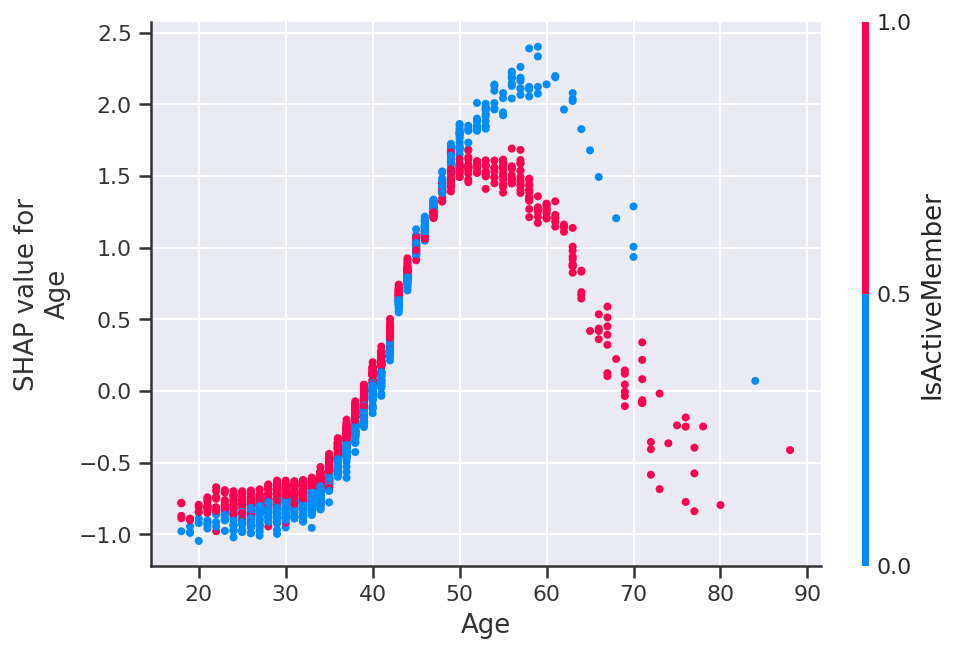

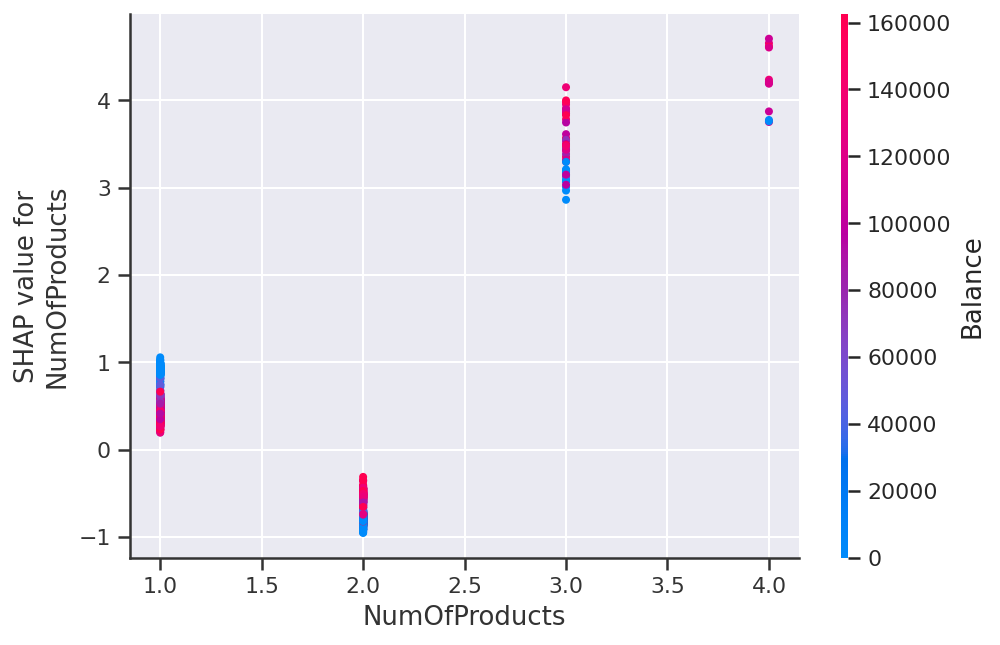

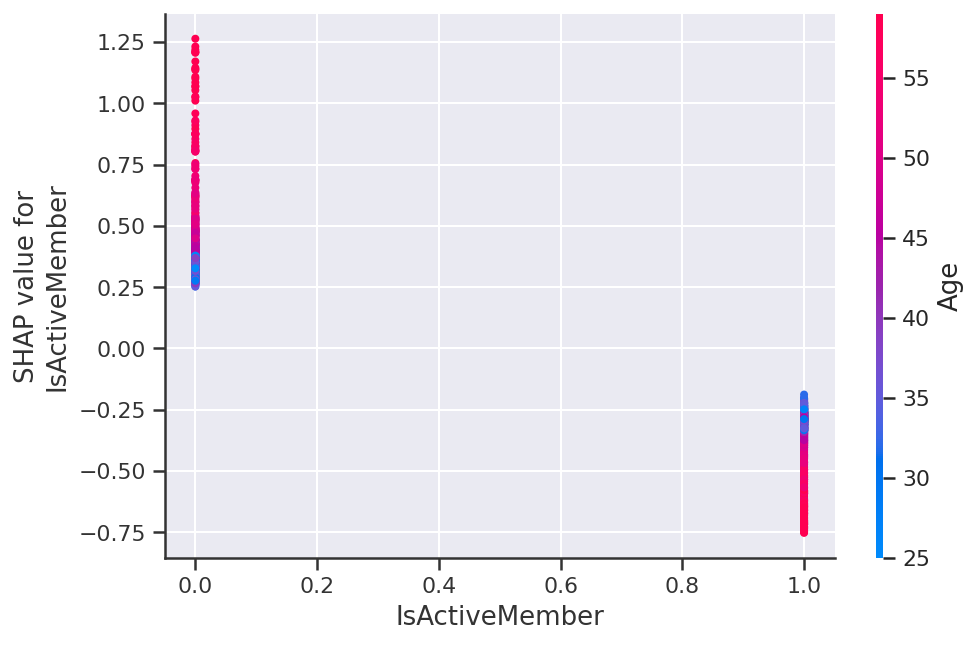

In [77]:
for feature in ['Age', 'NumOfProducts', 'IsActiveMember']:
    shap.dependence_plot(feature, shap_values, test[X])

Модель дает все большую вероятность оттока с возрастанием возраста до 50-60 лет, потом вероятность, наоборот стабильно падает.
<br>
Количество продуктов банка, используемых клиентом также имеет нелинейную зависимость - пользующиеся двумя продуктами менее всего склонны к оттоку, тремя - значительно больше, а пользующияся четырмя имеюют наибольшую веротяность оттока (по мнению модели), однако таких клиентов очень мало, поэтому к последнему выводу стоит относиться с осторожностью. 
<br>
Также, ожидаемо, модель дает значительно меньшую вероятность оттока активным клиентам в сравнении с неактивными.

## Итоги тестирования

Было проведено тестирование 5 моеделей - логистическая регрессии, метода k-ближайших соседей, метода опорных векторов, метода случайного леса, градиентого бустинга. Обучение проводилось на выборках с сэмплированием (алгоритмами SMOTE и Tomeks Links) и без. 

Результаты тестирования лучшей модели каждого типа представлены в таблице ниже:

In [78]:
res = pd.DataFrame([['Baseline','-', '-', 0.5, 0, 0.339],
                    ['Логистическая регрессия',  'базовая выборка', '3 фичи + веса классов', 0.73, 0.465, 0.461],
                    ['Метод k-ближайших соседей', 'андерсэмплированная выборка', '3 фичи', 0.81, 0.523, 0.568],
                    ['Метод опорных векторов', 'андерсэмплированная выборка', '-', 0.85, 0.576, 0.601],
                    ['Метод случайного леса', 'базовая выборка', '-', 0.85, 0.630, 0.626],
                    ['Градиентный бустинг', 'базовая выборка', '-', 0.86, 0.583, 0.622],
                    ['Градиентный бустинг', 'сырые данные', '-', 0.87, 0.582, 0.632]],
                   columns=['Метод', 'Выборка', 'Спецификации', 'ROC-AUC', 'F1-base', 'F1-max']
                  )
pd.set_option('precision', 3)
cm = sns.color_palette("rocket", as_cmap=True)
res.style.background_gradient(cmap=cm, axis=0)

,Метод,Выборка,Спецификации,ROC-AUC,F1-base,F1-max
0,Baseline,-,-,0.500,0.000,0.339
1,Логистическая регрессия,базовая выборка,3 фичи + веса классов,0.730,0.465,0.461
2,Метод k-ближайших соседей,андерсэмплированная выборка,3 фичи,0.810,0.523,0.568
3,Метод опорных векторов,андерсэмплированная выборка,-,0.850,0.576,0.601
4,Метод случайного леса,базовая выборка,-,0.850,0.630,0.626
5,Градиентный бустинг,базовая выборка,-,0.860,0.583,0.622
6,Градиентный бустинг,сырые данные,-,0.870,0.582,0.632


Наилучший результат мы смогли получить с помощью градиентного бустинга на сырых данных без обработки. Однако для этого пришлось заново разбить выборку, поэтому надо относситься к осторожностью к данным результатам. Лучший результат на выборке, на которой тестировались остальные модели также дал Метод случайного леса (на базовой выборке без сэмплирования). Учитывая, что градиетный бустинг также наиболее быстрый алгоритм, по сравнению со случайным лесом (учитывая подбор гиперпараметров) и методом опорных векторов, градиетный бустинг в данном случае наилучшая модель вне конкуренции.

Базовая F1-метрика (без оптимизации порога бинаризации выходных значений классификатора) наиболее высока у метода случайного леса. Также важное наблюдение - если после нахождения всех прараметров, перед тестированием на тестовой выборке, мы обучаемся на объединенной тренировочной и валидационной выборке, то базовая F1-метрика оказывается выше максимизированной - такое было у логистической регрессии и метода случайного леса.